In [1]:
import scanpy as sc
import scvelo as scv
import anndata
import os
import re
import pandas as pd
import numpy as np
import scipy
import importlib.util
import seaborn as sns
import sklearn
import matplotlib.pyplot as plt
spec = importlib.util.spec_from_file_location("ScanpyUtilsMT", os.path.expanduser("~/code/pollye/MTsc/utils/ScanpyUtilsMT.py"))
sc_utils = importlib.util.module_from_spec(spec)
spec.loader.exec_module(sc_utils)
sc.settings.autosave=False
sc.settings.autoshow=True



In [2]:
headpath=os.path.expanduser("/home/mt/Downloads/")
adata=sc.read_h5ad(os.path.join(headpath,'MultiseqRaw.h5ad'))

In [3]:
adata._inplace_subset_obs([x is not None for x in [re.search('[a-zA-Z]', x) for x in adata.obs['region']]])
adata.obs['region']=[re.sub('_A_|_B_','_',x) for x in adata.obs['region']]
adata.obs['simpleregion']=[re.sub('-1|-2','',x) for x in adata.obs['simpleregion']]
adata.obs['simpleregion']=[re.sub('Hippo$','Hippocampus',x) for x in adata.obs['simpleregion']]
adata.obs['simpleregion']=[re.sub('Hypo$','Hypothalamus',x) for x in adata.obs['simpleregion']]
adata.obs['simpleregion']=[re.sub('Thal$','Thalamus',x) for x in adata.obs['simpleregion']]
adata._inplace_subset_obs([x is None for x in [re.search('nan|Doublet|Negative', x) for x in adata.obs['region']]])


In [4]:
#data._inplace_subset_obs(adata.obs['batch']=='0')
adata._inplace_subset_obs([x is not None for x in [re.search('[a-zA-Z]', x) for x in adata.obs['region']]])

... storing 'simpleregion' as categorical
... storing 'region' as categorical


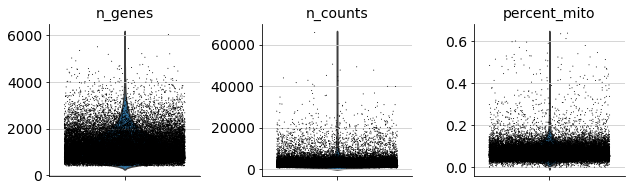

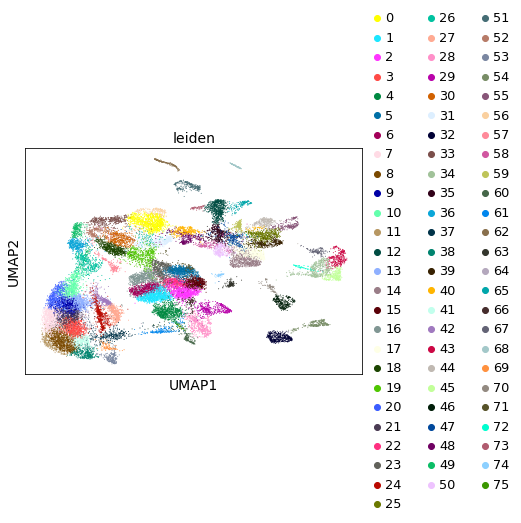

In [5]:
adata.var_names_make_unique()

mito_genes = [name for name in adata.var_names if name in ['ND1','ND2','ND4L','ND4','ND5','ND6','ATP6','ATP8','CYTB','COX1','COX2','COX3'] or 'MT-' in name]
ribo_genes = [name for name in adata.var_names if name.startswith('RPS') or name.startswith('RPL') ]

adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
adata.obs['percent_ribo'] = np.sum(
    adata[:, ribo_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1
#scanpy.api.pp.filter_genes_dispersion(adata,n_top_genes=np.sum(np.sum(adata.X, axis=0)>0))
sc.pp.filter_genes(adata, min_cells=20,inplace=True)
sc.pp.filter_cells(adata,min_genes=400)
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

adata.raw = adata.copy() 

sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)
varG=sc.pp.highly_variable_genes(adata, n_top_genes=10000,inplace=False)
adata._inplace_subset_var([x[0] for x in varG])
sc.pp.scale(adata,max_value=6)
sc.pp.pca(adata)
sc.pp.neighbors(adata,metric='manhattan')
sc.tl.umap(adata)
sc.tl.leiden(adata,resolution=5)
sc.pl.umap(adata,color='leiden')


In [6]:
clusterpca=[]
for c in adata.obs['leiden'].unique():
    print(c)
    a=adata.copy()
    a._inplace_subset_obs(a.obs['leiden']==c)
    clusterpca.append(a.obsm['X_pca'].mean(0))
clusterpca=np.array(clusterpca)
print(clusterpca)


4
22
12
21
7
37
15
52
9
39
10
29
13
36
11
31
3
59
57
41
6
53
43
26
54
33
0
25
20
18
61
64
40
42
65
38
44
30
68
49
45
56
32
28
8
17
46
47
19
1
35
14
2
55
62
66
16
23
67
72
5
63
74
73
70
34
58
71
75
60
48
27
50
69
24
51
[[-7.0095057e+00 -2.2875125e+00 -2.1541564e+00 ... -4.0949032e-01
   2.3947974e-01 -1.3865401e-01]
 [-7.3184114e+00 -1.4015794e+00 -6.1162720e+00 ... -2.0482218e-01
  -1.3199735e-01  1.2004366e-01]
 [ 6.1460409e+00 -1.6416109e+00  5.7789869e+00 ...  3.2606590e-01
   2.9582204e-03  2.9240620e-01]
 ...
 [-7.5438552e+00 -3.4819381e+00  1.6712967e+01 ... -5.5141008e-01
   1.7649776e+00  6.4141893e-01]
 [-6.9891109e+00 -1.5514083e+00  4.3280597e+00 ... -2.8074333e-02
   2.7433953e-01 -1.2456042e-02]
 [ 1.0279134e+01  6.1356950e+00 -3.0924745e+00 ...  5.5175537e-01
  -5.7655585e-01 -1.0533660e-01]]


In [7]:

adata.obs['leiden'].unique()[np.argsort([int(x)for x in adata.obs['leiden'].unique()])]

[0, 1, 2, 3, 4, ..., 71, 72, 73, 74, 75]
Length: 76
Categories (76, object): [4, 22, 12, 21, ..., 50, 69, 24, 51]

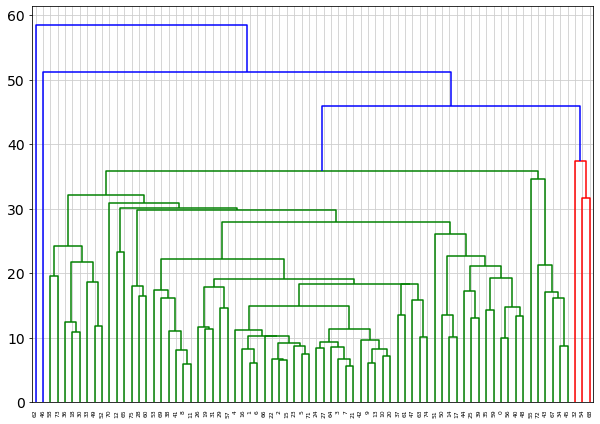

In [8]:
from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib import pyplot as plt

clusterpca=clusterpca[np.argsort([int(x)for x in adata.obs['leiden'].unique()]),:]

linked = linkage(clusterpca, 'average')

labelList = np.sort([int(x)for x in adata.obs['leiden'].unique()])

plt.figure(figsize=(10, 7))
dendrogram(linked,
            orientation='top',
            labels=labelList,
            distance_sort='descending',
            show_leaf_counts=True)
plt.show()

In [9]:
originaladata=adata.copy()

In [116]:
adata=originaladata.copy()
tree=scipy.cluster.hierarchy.to_tree(linked, rd=False)
def getAllDescendants(root):
    leftdescend=[]
    rightdescend=[]
    queue = [] 
    queue.append(root.left) 
    while(len(queue) > 0): 
        node = queue.pop(0) 
        if node.left is None and node.right is None:
            leftdescend.append(node.id)
        if node.left is not None: 
            queue.append(node.left) 
        if node.right is not None: 
            queue.append(node.right) 
    
    queue.append(root.right) 
    while(len(queue) > 0): 
        node = queue.pop(0) 
        if node.left is None and node.right is None:
            rightdescend.append(node.id)
        if node.left is not None: 
            queue.append(node.left) 
        if node.right is not None: 
            queue.append(node.right)
    return((leftdescend,rightdescend))

hierarchy=[]
queue = [] 
queue.append(tree) 
while(len(queue) > 0): 
    node = queue.pop(0) 
    if node.left is not None and node.right is not None:
        hierarchy.append([node.id,getAllDescendants(node)])
    if node.left.left is not None and node.left.right is not None: 
        queue.append(node.left) 
    if node.right.left is not None and node.right.right is not None: 
        queue.append(node.right) 

maxgenes=8000
ncells=8000
cells=np.random.choice(adata.obs.index,ncells,replace=False)
adata._inplace_subset_obs(cells)
adata._inplace_subset_var((-adata.X).var(0).argsort()[0:min(maxgenes,adata.shape[1])])

from collections import defaultdict
'''des=defaultdict()
for h in hierarchy:
    includeclusters=h[1][0]+h[1][1]
    a=adata.copy()
    a._inplace_subset_obs([int(x) in includeclusters for x in a.obs['leiden']])
    a.obs['clusters']=['left' if int(x) in h[1][0] else 'right' for x in a.obs['leiden'] ]
    sc.pp.highly_variable_genes(a, min_disp=1e-4)
    if(len(a.obs.clusters.unique())>1):
        sc.tl.rank_genes_groups(a, 'clusters', method='t-test_overestim_var',groups=['left','right'])
        result = a.uns['rank_genes_groups']
        groups = result['names'].dtype.names
        df=pd.DataFrame({group + '_' + key[:1]: result[key][group] for group in groups for key in ['names', 'scores']})
        des[str(h[0])]=(df['left_n'][0:6].tolist(),df['right_n'][0:6].tolist())
'''

des=defaultdict()
for h in hierarchy:
    print(h[0])
    des[str(h[0])]=([],[])
    includeclusters=h[1][0]+h[1][1]
    a=adata.copy()
    a._inplace_subset_obs([int(x) in includeclusters for x in a.obs['leiden']])
    a.obs['clusters']=['left' if int(x) in h[1][0] else 'right' for x in a.obs['leiden'] ]
    sc.pp.highly_variable_genes(a, min_disp=1e-4)
    a=a.T
    print('pca calcd')
    aleft=a.copy()
    aleft._inplace_subset_var(a.var['clusters']=='left')
    aright=a.copy()
    aright._inplace_subset_var(a.var['clusters']=='right')
    if aright.shape[1]>20 and aleft.shape[1]>20:
        sc.pp.pca(aleft)
        sc.pp.neighbors(aleft,metric=abscorrelation)
        sc.pp.pca(aright)
        sc.pp.neighbors(aright,metric=abscorrelation)
        print('neighbors calcd')
        def inverseTopNNoncor(l,r,N=10):
            cormat=l.uns['neighbors']['distances']
            nz=cormat.nonzero()
            d=scipy.sparse.csr_matrix(cormat.shape)
            for x,y in zip(nz[0],nz[1]):
                d[x,y]=abscorrelation(r.obsm['X_pca'][x,:],r.obsm['X_pca'][y,:])
            leftdiff=d-cormat
            sortinds=np.argsort(leftdiff.data)
            corpairs=["+".join(sorted([a1,a2])) for a1,a2 in zip(l.obs.index[nz[0][sortinds]],l.obs.index[nz[1][sortinds]])]
            return(list(set(corpairs))[0:N])
        corL=inverseTopNNoncor(aleft,aright)
        corR=inverseTopNNoncor(aright,aleft)
        des[str(h[0])]=(corL,corR)

150
pca calcd
neighbors calcd
149
pca calcd
neighbors calcd
148
pca calcd
neighbors calcd
146
pca calcd
neighbors calcd
147
pca calcd
neighbors calcd
144
pca calcd
neighbors calcd
145
pca calcd
neighbors calcd
143
pca calcd
neighbors calcd
137
pca calcd
neighbors calcd
142
pca calcd
neighbors calcd
132
pca calcd
130
pca calcd
133
pca calcd
neighbors calcd
141
pca calcd
neighbors calcd
120
pca calcd
neighbors calcd
107
pca calcd
neighbors calcd
127
pca calcd
neighbors calcd
136
pca calcd
neighbors calcd
140
pca calcd
neighbors calcd
117
pca calcd
neighbors calcd
100
pca calcd
neighbors calcd
106
pca calcd
neighbors calcd
124
pca calcd
139
pca calcd
neighbors calcd
91
pca calcd
neighbors calcd
119
pca calcd
neighbors calcd
134
pca calcd
neighbors calcd
138
pca calcd
neighbors calcd
122
pca calcd
neighbors calcd
128
pca calcd
neighbors calcd
135
pca calcd
neighbors calcd
118
pca calcd
neighbors calcd
123
pca calcd
neighbors calcd
126
pca calcd
neighbors calcd
110
pca calcd
neighbors calcd

In [ ]:
des

In [118]:
import ete3
def getNewick(node, newick, parentdist, leaf_names):
    if node.is_leaf():
        return "%s:%.2f%s" % (leaf_names[node.id], parentdist - node.dist, newick)
    else:
        if len(newick) > 0:
            newick = ")%s:%.2f%s" % (node.id,parentdist - node.dist, newick)
        else:
            newick = ");"
        newick = getNewick(node.get_left(), newick, node.dist, leaf_names)
        newick = getNewick(node.get_right(), ",%s" % (newick), node.dist, leaf_names)
        newick = "(%s" % (newick)
        return newick
    
import ete3
print(getNewick(tree, "", tree.dist, labelList))
t= ete3.Tree(getNewick(tree, "", tree.dist, labelList), format=1)
ts = ete3.TreeStyle()
ts.show_leaf_name = True
ts.show_branch_length = False
ts.show_branch_support = False
#t.show(tree_style=ts)

(((((68:31.65,54:31.65)143:5.76,32:37.41)147:8.54,((((((45:8.74,34:8.74)91:7.37,67:16.11)117:0.95,43:17.06)120:4.20,72:21.26)132:13.28,55:34.54)145:1.29,(((((((((((48:13.34,40:13.34)109:1.47,(56:9.99,0:9.99)95:4.82)114:4.42,(59:14.22,35:14.22)112:5.01)129:1.93,((39:13.09,25:13.09)108:4.11,44:17.20)121:3.96)131:1.45,((17:10.11,14:10.11)97:3.33,50:13.44)110:9.17)135:3.45,51:26.06)138:1.86,((((((74:10.05,63:10.05)96:5.75,47:15.80)116:2.54,(61:13.45,37:13.45)111:4.89)125:0.02,(((((20:7.10,10:7.10)83:1.10,(13:6.05,9:6.05)79:2.15)87:1.47,42:9.66)94:1.66,((((21:5.67,7:5.67)76:1.02,3:6.69)82:1.87,64:8.56)89:0.76,(27:8.36,24:8.36)88:0.97)93:2.00)104:3.64,((((((71:7.52,5:7.52)84:1.13,23:8.65)90:0.43,((15:6.51,2:6.51)80:0.17,22:6.68)81:2.40)92:1.12,66:10.20)98:0.06,((6:5.98,1:5.98)78:2.20,16:8.18)86:2.08)99:0.90,4:11.16)102:3.81)115:3.40)126:0.68,((57:14.51,29:14.51)113:3.34,((31:11.31,19:11.31)103:0.31,26:11.61)105:6.24)123:1.20)128:3.18,(((((11:5.91,8:5.91)77:2.19,41:8.09)85:2.97,38:11.06)101:5

In [119]:
queue = [] 
queue.append(t) 
while(len(queue) > 0): 
    node = queue.pop(0)
    if node.name in des.keys():    
        node.children[1].add_face(ete3.TextFace(' '.join(des[node.name][0])), column=0, position="branch-bottom")
        node.children[0].add_face(ete3.TextFace(' '.join(des[node.name][1])), column=0, position="branch-top")
    if node.children is not None:
        for c in node.children:
            queue.append(c)

In [120]:
t.show(tree_style=ts)

In [121]:
t.render("/home/mt/Downloads/HierarchicalCorrelationSmalltest.pdf", w=600, dpi=300, tree_style=ts)

{'nodes': [[0.005103669286701609,
   41.121595898116844,
   0.04593302358031449,
   41.16242525241046,
   0,
   None],
  [0.26271845040723335,
   31.568859448573413,
   0.3035478047008462,
   31.609688802867026,
   1,
   None],
  [31.92588270510402,
   12.958442470296601,
   31.966712059397633,
   12.999271824590213,
   2,
   None],
  [60.812650867835124,
   1.1687402666546685,
   60.85348022212874,
   1.2095696209482814,
   3,
   None],
  [100.52940525694704,
   0.6634770072712092,
   100.57023461124066,
   0.7043063615648221,
   4,
   None],
  [132.43754563740552,
   0.326634834348903,
   132.47837499169913,
   0.3674641886425159,
   5,
   None],
  [143.14504380090548,
   1.0003191801935154,
   143.1858731551991,
   1.0411485344871283,
   6,
   None],
  [93.0984627755095,
   1.6740035260381279,
   93.13929212980312,
   1.7148328803317407,
   7,
   None],
  [59.4550748375725,
   24.748144673938533,
   59.49590419186611,
   24.788974028232147,
   8,
   None],
  [94.25189203430406,
   5

In [6]:
adata.X=adata.raw[:,[x[0] for x in varG]].X


In [7]:
gdata=anndata.AnnData(adata.X.T,var=adata.obs,obs=adata.var)
sc.pp.pca(gdata, n_comps=50)

In [21]:
import numba
@numba.njit()
def abscorrelation(x, y):
    mu_x = 0.0
    mu_y = 0.0
    norm_x = 0.0
    norm_y = 0.0
    dot_product = 0.0

    for i in range(x.shape[0]):
        mu_x += x[i]
        mu_y += y[i]

    mu_x /= x.shape[0]
    mu_y /= x.shape[0]

    for i in range(x.shape[0]):
        shifted_x = x[i] - mu_x
        shifted_y = y[i] - mu_y
        norm_x += shifted_x ** 2
        norm_y += shifted_y ** 2
        dot_product += shifted_x * shifted_y

    if norm_x == 0.0 and norm_y == 0.0:
        return 0.0
    elif dot_product == 0.0:
        return 1.0
    else:
        return 1.0 - np.absolute(dot_product / np.sqrt(norm_x * norm_y))
    
sc.pp.neighbors(gdata,metric=abscorrelation)

NameError: name 'gdata' is not defined

In [9]:
sc.tl.umap(gdata)
sc.tl.leiden(gdata,resolution=5)

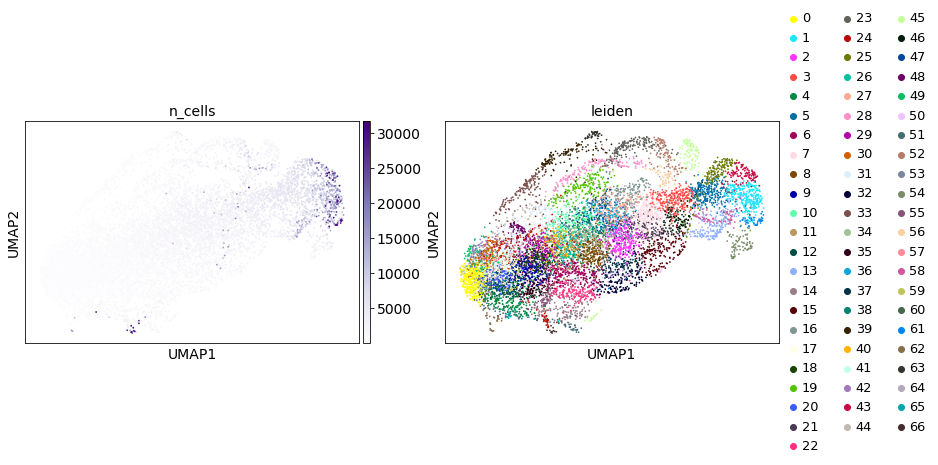

In [10]:
sc.pl.umap(gdata,color=['n_cells','leiden'])

In [11]:
nz=gdata.uns['neighbors']['distances'].nonzero()
newdist=[]

for x,y in zip(nz[0],nz[1]):
    newdist.append(abscorrelation(gdata.obsm['X_pca'][x,:],gdata.obsm['X_pca'][y,:]))
d=scipy.sparse.csr_matrix((newdist,(nz[0],nz[1])))


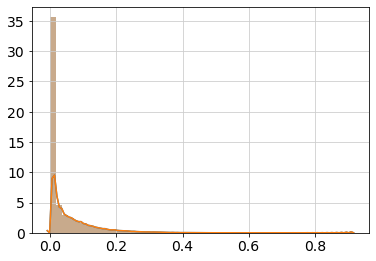

In [12]:
sns.distplot(d.data)
sns.distplot(gdata.uns['neighbors']['distances'].data)

In [13]:
cat_columns = gdata.obs.select_dtypes(['category']).columns
gdata.obs[cat_columns] = gdata.obs[cat_columns].astype(str)
del cat_columns
modulesvd={}
import sklearn
for c in gdata.obs['leiden'].unique():
    svdinstance=sklearn.decomposition.TruncatedSVD(n_components=1)
    svd=svdinstance.fit(gdata[gdata.obs['leiden']==c,:].X)
    modulesvd[c]=svd.components_

In [14]:
for c in modulesvd.keys():
    adata.obs['eigengene'+c]=modulesvd[c].flatten()

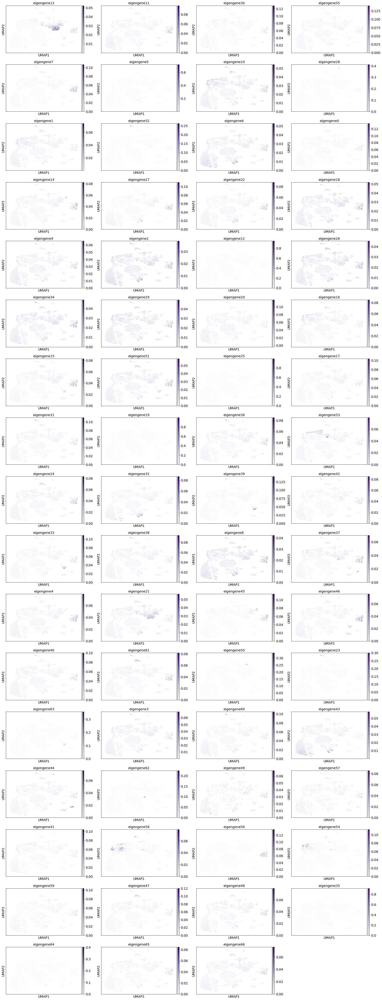

In [15]:
sc.pl.umap(adata, color=[c for c in adata.obs.columns if 'eigengene' in c])

In [40]:
print(list(gdata.obs.index[gdata.obs['leiden']=='50']))

['PADI2', 'TMEM125', 'LRRC8B', 'S100A1', 'MPZ', 'GJC2', 'SLC45A3', 'NFASC', 'TNR', 'MOBP', 'ANKRD44', 'TF', 'TNK2', 'PDGFRA', 'ENSMMUG00000017401', 'UGT8', 'HHIP', 'SCRG1', 'ENPP6', 'OLIG2', 'HIP1', 'EGFR', 'ENSMMUG00000040062', 'GJC3', 'LHFPL3', 'GPR37', 'HIPK2', 'TRIO', 'MOG', 'MLN', 'ICK', 'NT5E', 'EPB41L2', 'DACT2', 'MAP1A', 'SECISBP2L', 'SMOC1', 'GJB1', 'PLP1', 'C8H8orf46', 'PMP2', 'MMP16', 'FBXO32', 'KLRC3', 'GPD1', 'ANKS1B', 'HRK', 'ENSMMUG00000017765', 'ZNF488', 'REEP3', 'PCDH15', 'PLEKHA1', 'RRAS2', 'NRIP3', 'RELT', 'ENDOD1', 'GRIA4', 'BACE1', 'GPR17', 'DPP10', 'ERMN', 'ENSMMUG00000015292', 'NEU4', 'PLPPR1', 'PTPDC1', 'SLC1A1', 'SEMA4D', 'STRN', 'TGFA', 'RTKN', 'MAL', 'ENSMMUG00000005766', 'NKAIN4', 'BCAS1', 'SULF2', 'EYA2', 'FERMT1', 'ELFN2', 'YPEL2', 'ENSMMUG00000008423', 'CA10', 'CNP', 'RND2', 'ROGDI', 'PLLP', 'FA2H', 'CABLES1', 'TTC39C', 'CHST9', 'DSEL', 'MBP', 'PLPP2', 'SHD', 'ENSMMUG00000028830', 'MAG', 'ENSMMUG00000028772', 'SIRT2', 'KLK6', 'TNNT1']


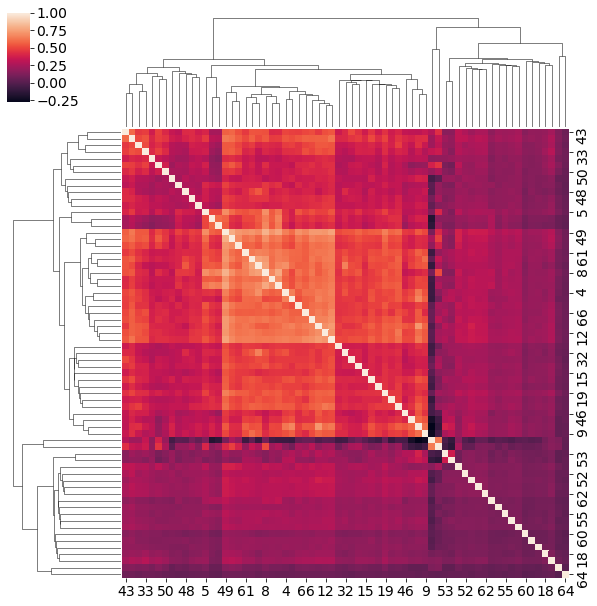

In [16]:
melist=[]
for c in modulesvd.keys():
    melist.append(modulesvd[c].flatten())
sns.clustermap(scipy.stats.spearmanr(np.array(melist).T)[0])

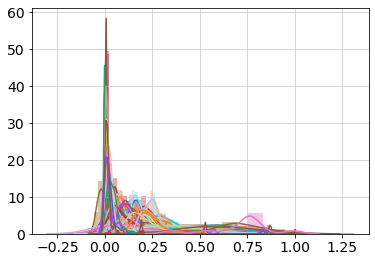

In [17]:
for c in gdata.obs['leiden'].unique():
    gsub=gdata[gdata.obs['leiden']==c,:].X
    cors=[]
    for i in range(gsub.shape[0]):
        cors.append(np.corrcoef(modulesvd[c][0,:],gsub[i,:].toarray())[0,1])
    sns.distplot(cors)


In [19]:
gsub=gdata[gdata.obs['leiden']=='20',:].X

cors=[]
for i in range(gsub.shape[0]):
    cors.append(np.corrcoef(modulesvd[c][0,:],gsub[i,:])[0,1])
    print(np.corrcoef(modulesvd[c][0,:],gsub[i,:])[0,1])
    sns.scatterplot(modulesvd[c][0,:],gsub[i,:])
    plt.show()
sns.distplot(cors)


ValueError: all the input array dimensions except for the concatenation axis must match exactly

In [58]:
@numba.njit()
def correlation_vector(x, y):
    mu_x = 0.0
    mu_y = 0.0
    norm_x = 0.0
    norm_y = 0.0
    cov=[]
    dot_product = 0.0

    for i in range(x.shape[0]):
        mu_x += x[i]
        mu_y += y[i]

    mu_x /= x.shape[0]
    mu_y /= x.shape[0]

    for i in range(x.shape[0]):
        shifted_x = x[i] - mu_x
        shifted_y = y[i] - mu_y
        norm_x += shifted_x ** 2
        norm_y += shifted_y ** 2
        covi=shifted_x * shifted_y
        cov.append(covi)
        dot_product += covi

    norm_dot=dot_product/float(x.shape[0])
    normprod=np.sqrt(norm_x * norm_y)
    return [(x - norm_dot)/normprod for x in cov]

correlation_vector(np.array([1,2,3]),np.array([2,3,12]))

[0.030261376633440133, -0.30261376633440124, 0.27235238970096104]

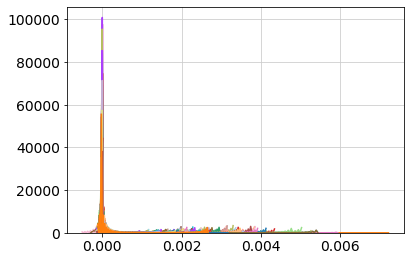

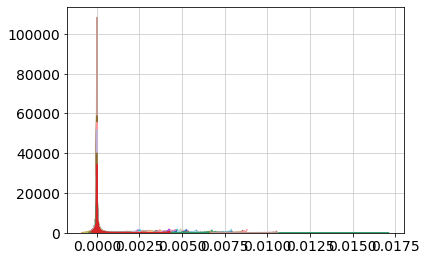

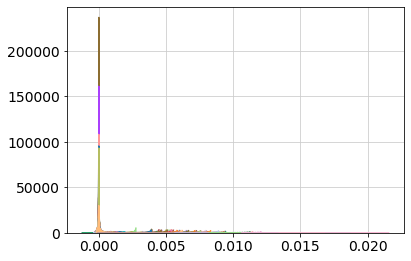

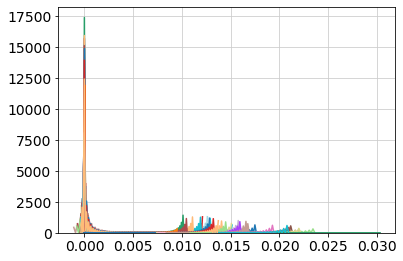

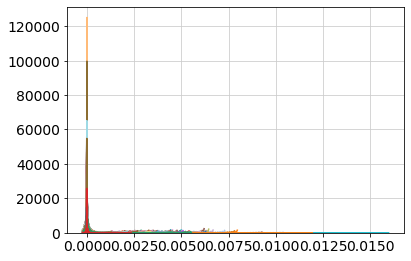

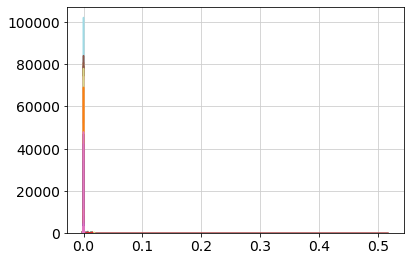

KeyboardInterrupt: 

In [61]:
for c in gdata.obs['leiden'].unique():
    gsub=gdata[gdata.obs['leiden']==c,:].X
    y=modulesvd[c]
    for i in range(gsub.shape[0]):
        x=gsub[i,:].toarray()
        #print(scipy.stats.pearsonr(x,y.flatten()))
        #sns.scatterplot(x.flatten(),y.flatten())
        #plt.show()
        #The difference between covariance of gene i in cells
        sns.distplot(correlation_vector(x.flatten(),y.flatten()))
        #plt.show()
    plt.show()

In [ ]:
for i in range(adata.shape[0]):
    print(i)
    nz=adata.uns['neighbors']['distances'][i,:].nonzero()[1]
    g=gdata[:,nz].copy()
    print(nz)
    print(g)


In [ ]:
distdict={}
pcadict={}
for r in gdata.var['simpleregion'].unique():
    print(r)
    g=gdata[:,gdata.var['simpleregion']==r].copy()
    del g.uns['neighbors']
    del g.obsm['X_pca']
    sc.pp.pca(g)
    sc.pp.neighbors(g,metric='correlation',n_neighbors=10,use_rep='X')
    #nz=g.uns['neighbors']['distances'].nonzero()
    #newdist=[]
    #for x,y in zip(nz[0],nz[1]):
    #    newdist.append(scipy.spatial.distance.correlation(gdata.obsm['X_pca'][x,:],gdata.obsm['X_pca'][y,:]))
    #d=scipy.sparse.csr_matrix((newdist,(nz[0],nz[1])))
    #sns.distplot(d.data)
    #sns.distplot(gdata.uns['neighbors']['distances'].data)
    distdict[r]=g.uns['neighbors']['distances']
    pcadict[r]=g.obsm['X_pca']
    #sns.distplot(d.data-g.uns['neighbors']['distances'].data)
    #plt.show()


In [23]:
def sparsecordistcontrasts(distdict,pcadict,a,b):
    acor=distdict[a]
    bcor=distdict[b]
    apca=pcadict[a]
    bpca=pcadict[b]
    nz=acor.nonzero()
    newdist=[]
    for x,y in zip(nz[0],nz[1]):
        newdist.append(abscorrelation(bpca[x,:],bpca[y,:]))
    return(acor-scipy.sparse.csr_matrix((newdist,(nz[0],nz[1]))))

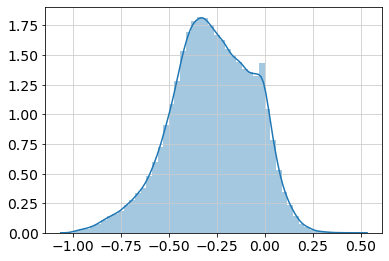

In [24]:
sns.distplot(sparsecordistcontrasts(distdict,pcadict,'MGE','CGE').data)

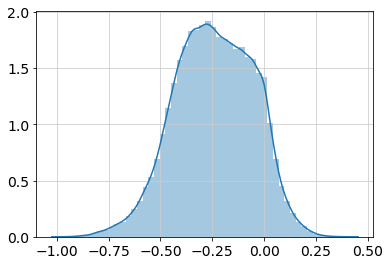

In [25]:
sns.distplot(sparsecordistcontrasts(distdict,pcadict,'CGE','MGE').data)

In [48]:
region1='Thalamus'
region2='Hypothalamus'
a=sparsecordistcontrasts(distdict,pcadict,region1,region2)

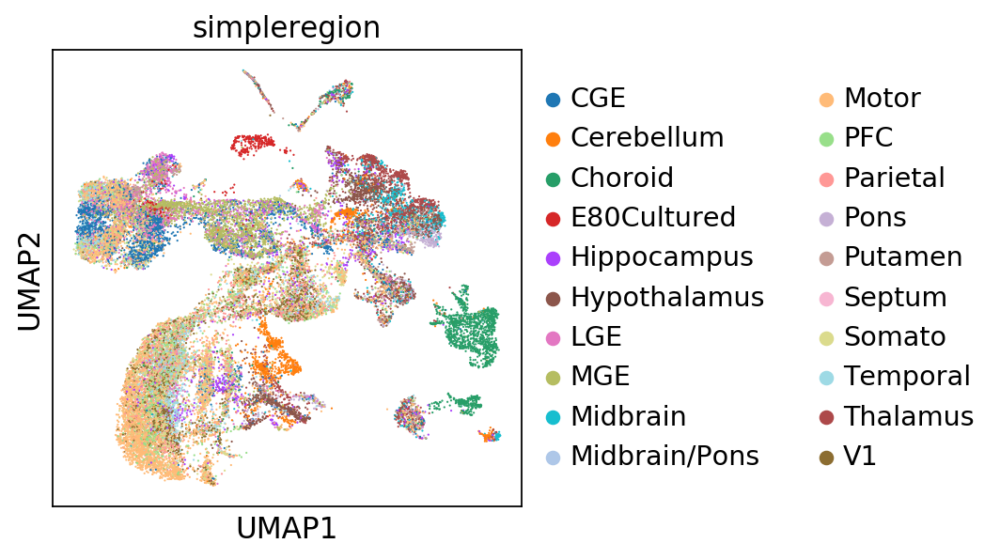

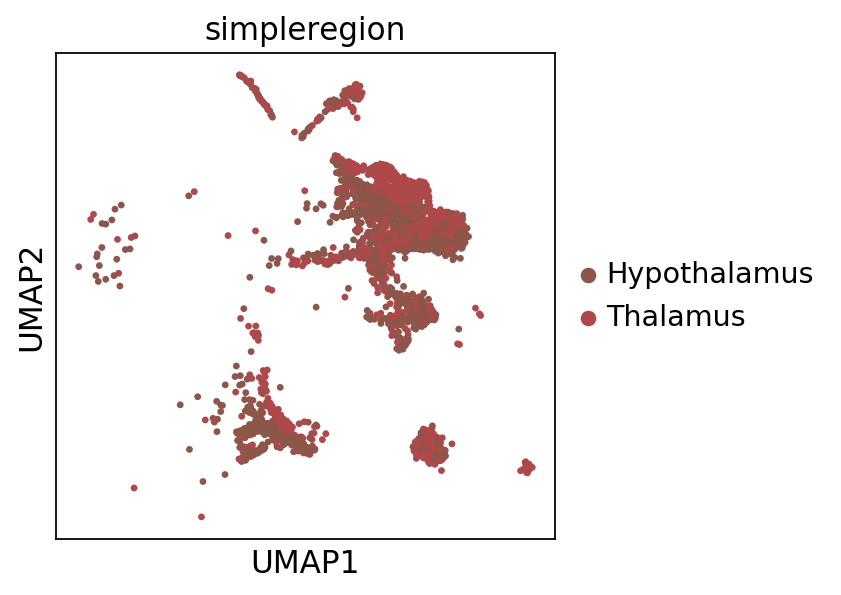

In [51]:
sc.pl.umap(adata,color='simpleregion')
sc.pl.umap(adata[(adata.obs['simpleregion']==region1)| (adata.obs['simpleregion']==region2),:],color='simpleregion')

[-0.954460837833452, -0.947352347680697, -0.9318519466611674, -0.9318519466611674, -0.9297744511127072, -0.9297744511127072, -0.9236258006587451, -0.9188095376000528, -0.913735307450359, -0.9134086771542761, -0.9048542882144771, -0.9039496207960181, -0.9039496207960181, -0.9030479178776131, -0.9030479178776131, -0.9026048941886929, -0.9018378876066556, -0.9018378876066556, -0.9013313301546987, -0.8983387659371133, -0.8914848016440667, -0.8894602433488492, -0.8886330948614074, -0.888589246348051, -0.888589246348051, -0.8853207476598677, -0.8820586721411707, -0.8758035705021084, -0.8729453992651658, -0.8729453992651658, -0.8725839877103735, -0.871219951173349, -0.8711974466340725, -0.8710576452833504, -0.8694984770246103, -0.8671024433268341, -0.8671024433268341, -0.864257107321843, -0.8641235903512885, -0.8637768827290584, -0.8637768827290584, -0.8636975331305958, -0.8632585994210595, -0.8632585994210595, -0.8630328847162121, -0.8622641517043437, -0.8603426918685638, -0.859604229853796,

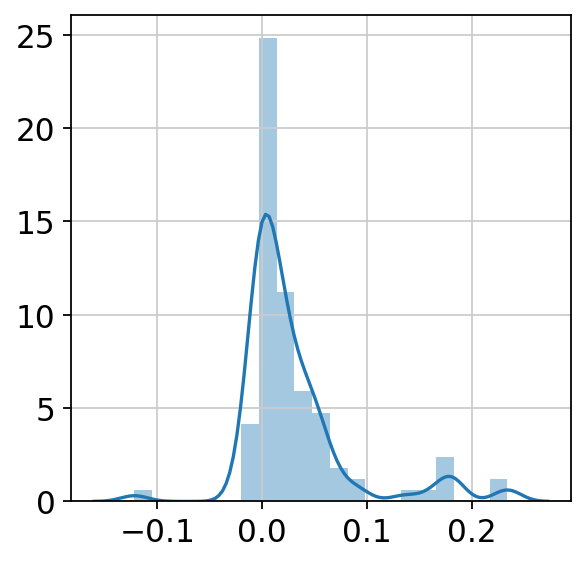

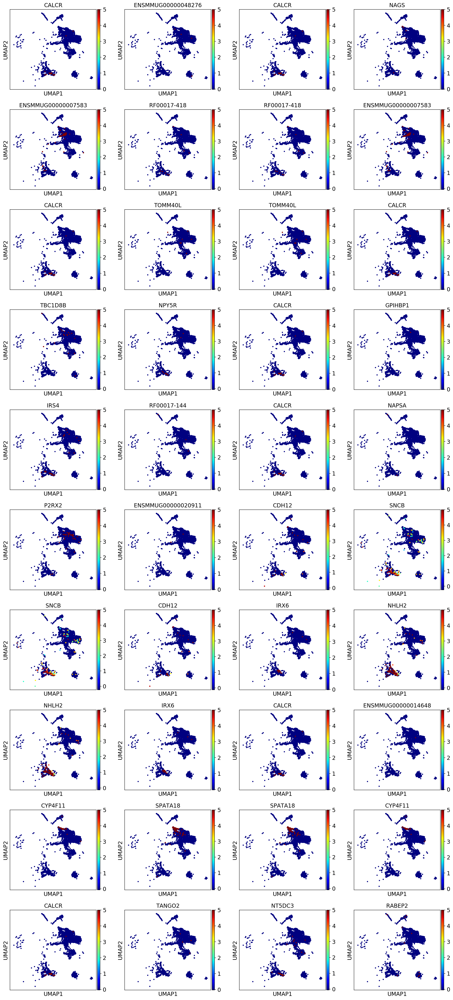

In [49]:
sc.set_figure_params(color_map="jet")
ranks=np.argsort(a.data)#scipy.stats.rankdata(a.data,'ordinal')-1
nz=a.nonzero()
sns.distplot([np.corrcoef(gdata.X[nz[0][ranks][i],:], gdata.X[nz[1][ranks][i],:])[0,1] for i in range(100)])
print([a.data[ranks][i] for i in range(100)])
topgenes=[val for pair in zip(gdata.obs.index[nz[0][ranks]], gdata.obs.index[nz[1][ranks]]) for val in pair][0:40]
sc.pl.umap(adata[(adata.obs['simpleregion']==region1)| (adata.obs['simpleregion']==region2),:],color=topgenes)

[0.42385768412407343, 0.4123472094763184, 0.3917621335578385, 0.3850408104016775, 0.37509521365635645, 0.3537029520137476, 0.3516397351274425, 0.34895854976239404, 0.34085179252151154, 0.3406093847407271, 0.33971213181702586, 0.3340445529399313, 0.3319782699263433, 0.3290398946437457, 0.32759348565721913, 0.3251183132994728, 0.32411425307323605, 0.3220352578946215, 0.3190459881327523, 0.31848464712554303, 0.3165432442362264, 0.31181194315008853, 0.3068521150410285, 0.30646135423996124, 0.3062290889032896, 0.3052201979161231, 0.3020587178984253, 0.30114138861884754, 0.301060975982008, 0.30055602726985353, 0.29763988278514386, 0.29512162538550435, 0.2942725906006649, 0.2927959208939368, 0.2925963469916145, 0.29159859363621754, 0.2911890342801915, 0.28921359049938244, 0.2890819500680438, 0.28714280254055924, 0.28672010609904774, 0.28513954983563505, 0.28296260280318675, 0.28205981792627344, 0.2817771162926179, 0.2815038649179492, 0.28029960680216603, 0.2801382592249295, 0.2785885511093396

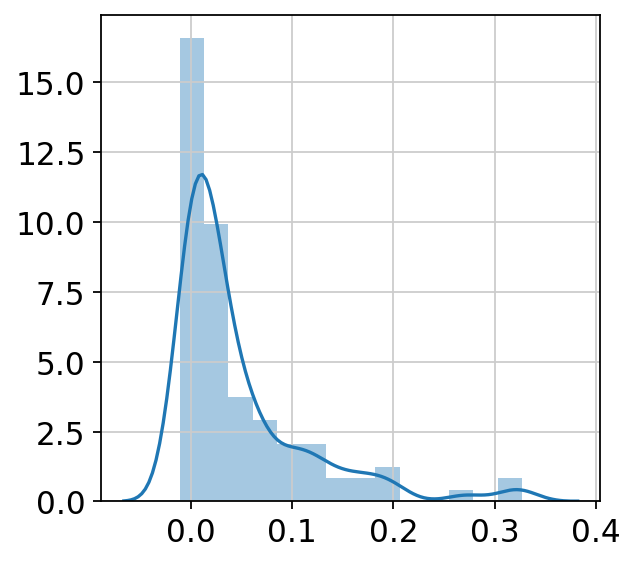

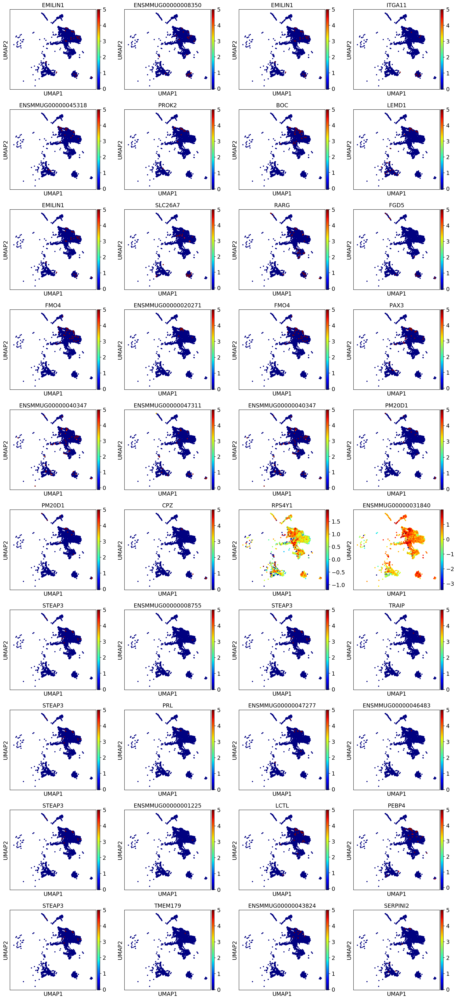

In [50]:
ranks=np.argsort(-a.data)#scipy.stats.rankdata(-(a.data),'ordinal')-1
nz=a.nonzero()
print([a.data[ranks][i] for i in range(100)])
sns.distplot([np.corrcoef(gdata.X[nz[0][ranks][i],:], gdata.X[nz[1][ranks][i],:])[0,1] for i in range(100)])
topgenes=[val for pair in zip(gdata.obs.index[nz[0][ranks]], gdata.obs.index[nz[1][ranks]]) for val in pair][0:40]
sc.pl.umap(adata[(adata.obs['simpleregion']==region1)| (adata.obs['simpleregion']==region2),:],color=topgenes)

In [56]:
clustersvd={}
import sklearn
for c in adata.obs['leiden'].unique():
    svdinstance=sklearn.decomposition.TruncatedSVD(n_components=1)
    svd=svdinstance.fit(adata[adata.obs['leiden']==c,:].X)
    clustersvd[c]=svd.components_

In [63]:
sklearn np.array(list(clustersvd.values()))[:,0,:]

array([[-0.00353022, -0.00064669, -0.0043469 , ..., -0.00901361,
        -0.00532515, -0.03300703],
       [-0.003232  , -0.00879491, -0.00384867, ..., -0.01762809,
        -0.01322982, -0.01641512],
       [-0.00159507, -0.00047268, -0.00261062, ...,  0.02092154,
         0.01333832,  0.02761903],
       ...,
       [-0.00178349, -0.00207042, -0.00132961, ..., -0.01047775,
         0.00768042,  0.01108246],
       [-0.00331916,  0.00543094, -0.0027325 , ...,  0.02520423,
         0.01325652,  0.01867342],
       [-0.00174975,  0.00106759,  0.00508557, ...,  0.01555386,
         0.01154965,  0.03754395]], dtype=float32)

In [ ]:
#for c in gdata.obs['leiden'].unique():
#    print(list(gdata.obs.index[gdata.obs['leiden']==c]))

saving figure to file ./figures/umap_MultiseqSummary.pdf


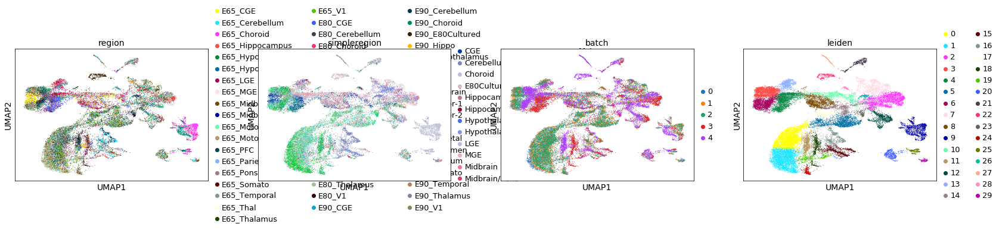

saving figure to file ./figures/umap_region.pdf


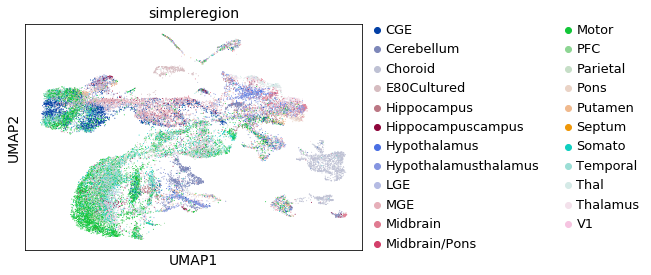

saving figure to file ./figures/umap_leiden.pdf


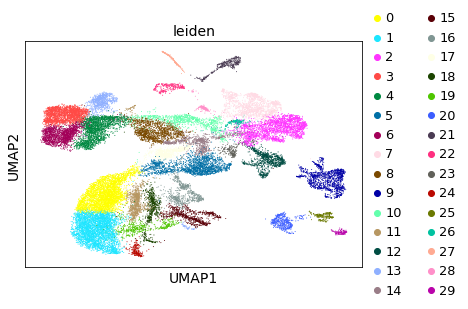

saving figure to file ./figures/umap_tp.pdf


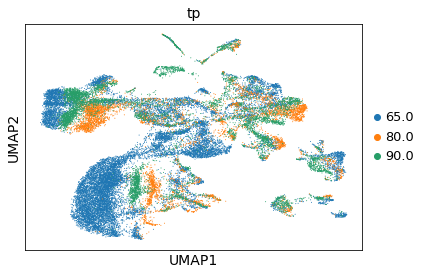

saving figure to file ./figures/umap_ActualRegion.pdf


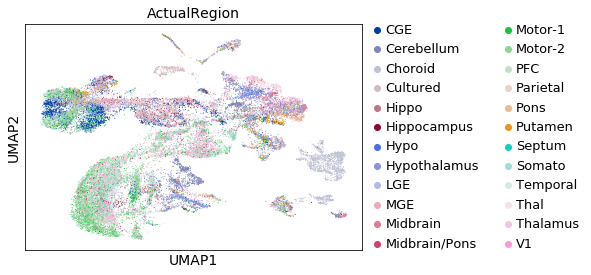

In [39]:




#sc_utils.cell_cycle_score(adata)
#sc.pl.umap(adata, color=['leiden','n_counts','region','phase'])
sc.pl.umap(adata, color=['region','simpleregion','batch','leiden'],save='_MultiseqSummary')
sc.pl.umap(adata, color=['simpleregion'],save='_region')
sc.pl.umap(adata, color=['leiden'],save='_leiden')
sc.pl.umap(adata, color=['tp'],save='_tp')
sc.pl.umap(adata, color=['ActualRegion'],save='_ActualRegion')


In [43]:
import re
adata.obs['subclassname']=[re.sub('mkrscore','',x) for x in adata.obs.loc[:,['mkrscore' in x for x in adata.obs.columns]].astype('float').idxmax(axis=1)]
normalizedadata.obs['subclassname']=[re.sub('mkrscore','',x) for x in adata.obs.loc[:,['mkrscore' in x for x in adata.obs.columns]].astype('float').idxmax(axis=1)]
sc.pl.umap(adata,color=['subclassname'])

ValueError: attempt to get argmax of an empty sequence

... storing 'classname' as categorical


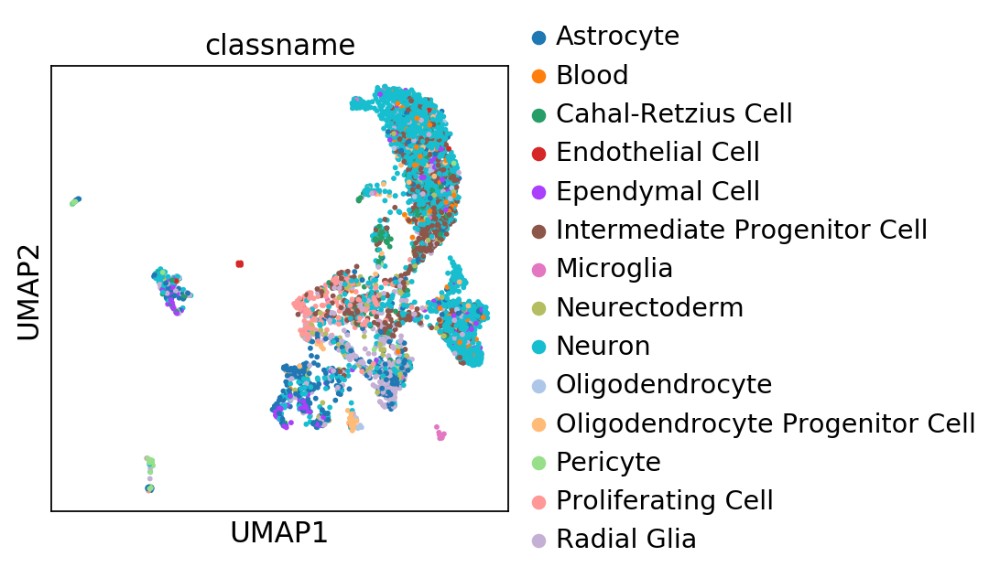

In [11]:
def most_frequent(List): 
    return max(set(List), key = List.count) 
classlist=[]
for c in adata.obs['subclassname']:
    fullbool=[c in x for x in adata.uns['markers']['fullclass']]
    flatclass=[item for sublist in adata.uns['markers'].loc[fullbool,'type'] for item in sublist]
    classlist.append(most_frequent(flatclass))
adata.obs['classname']=classlist
normalizedadata.obs['classname']=classlist
sc.pl.umap(adata,color=['classname'])

In [12]:
adata.obs['region']=[re.sub('_A_|_B_','_',x) for x in adata.obs['region']]
normalizedadata.obs['region']=[re.sub('_A_|_B_','_',x) for x in adata.obs['region']]

In [69]:
def variance(X,axis=1):
    return( (X.power(2)).mean(axis=axis)-(np.power(X.mean(axis=axis),2)) )
